# NASA Exoplanet Archive Exploratory Data Analysis

Dataset source: https://exoplanetarchive.ipac.caltech.edu/docs/counts_detail.html

Dataset type: Planetary Systems Composite Parameters <a href="#footnote-1">[1]</a>

Dataset exported on **2023-05-13**

The NASA Exoplanet Archive is an astronomical exoplanet and stellar catalog that collates and cross-correlates astronomical data and information on exoplanets and their host stars. These data include stellar parameters (such as positions, magnitudes, and temperatures), exoplanet parameters (such as masses and orbital parameters) and discovery/characterization data (such as published radial velocity curves, photometric light curves, images, and spectra).

Data column definition can be found on the [README.md](README.md) file.

# Table of Contents
1. [Goal](#goal)
2. [What is an Exoplanet](#what-is-an-exoplanet)
3. [Load and preprocess data](#load-and-preprocess-data)
    * [Detect missing values](#detect-missing-values)
    * [Imputation](#imputation)
    * [Drop features with high number of null values](#drop-features-with-high-number-of-null-values)
    * [Drop highly correlated features](#drop-highly-correlated-features)
4. [Discovery methods](#discovery-methods)
    * [Relationship between planet features and discovery method](#relationship-between-planet-features-and-discovery-method)
5. [Stellar host](#stellar-host)
    * [Binary and multiple star systems](#binary-and-multiple-star-system)
7. [Web scraping exoplanet types](#web-scraping-exoplanet-types)
8. [Exoplanet physical characteristics](#exoplanet-physical-characteristics)
9. [Orbital parameters](#orbital-parameters)
10. [Detecting outliers](#detecting-outliers)

## Goal<a nams="goal" />

The objective of this project is to analyze the exoplanet dataset and optimize it for machine learning applications. While the specific machine learning objectives have yet to be defined, the aim is to gain a thorough understanding of the dataset through further analysis. Possible areas for investigation include:
- Linear regression: to predict certain orbital parameters based on other relevant parameters in the dataset
- Logistic regression: for binary classification, such as distinguishing between planets and non-planets or habitable and non-habitable planets (additional datasets may be required)
- Softmax regression: to classify the type of planet based on planet parameters (additional datasets may be required)

## What is an Exoplanet?<a nams="what-is-an-exoplanet" />

An exoplanet is a planet located outside of our solar system. While most orbit around other stars, some exoplanets freely float around the galaxy instead, known as rogue planets. For every star you see in the night sky, on average, has at least one planet. Majority of exoplanets found to date are located in the Milky Way which is only a small sample of the galaxy. In a decade, the number of exoplanets discovered could potentially increase to tens of thousands as more robotic telescopes are launched into space with better observing capabilities.

## Load and preprocess dataset<a nams="load-and-preprocess-data" />

The dataset has been exported as a CSV file. Most of the planetary parameters are measurements of data in continuous variables. Some of theses measurement columns may come with positive/negative uncertainties and limit flag columns. For the initial exploration, we can simplify the data by dropping the columns related to uncertainties. We can come back to the uncertainty values later on to obtain a more accurate representation when we determine key parameters that are crucial to our analysis.

Some data in the dataset are stored as 0 or 1 in int64 format, but they can be better represented as boolean values. The documentation defines them as binary data, and converting them to bool can make the dataset more efficient and easier to work with.

Some other columns include categorical values in string such as the discovery method, discovery location and discovery telescope name. Discovery method columns are actually also redundantly represented in one-hot encoding so they can be dropped. Other categorical values do not have such one-hot encoded columns but we can always create our own if we find the data to be important. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('./data/exoplanet_dataset.csv')
with open('./data/columns.txt', 'r') as file:
     col_names = [col.strip() for col in file.readlines()]
    
# Select the columns of interest from the dataset
df = df.filter([col_name for col_name in col_names], axis=1)

# Update the data type int64 into bool on boolean columns as documented in the column definition
bool_col_names = ['rv_flag', 'pul_flag', 'ptv_flag', 'tran_flag', 'ast_flag', 'obm_flag', 'micro_flag', 'etv_flag', 'ima_flag', 'dkin_flag', 'ttv_flag', 'cb_flag']
df[bool_col_names] = df[bool_col_names].astype(bool)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5347 entries, 0 to 5346
Data columns (total 89 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   pl_name          5347 non-null   object 
 1   hostname         5347 non-null   object 
 2   sy_snum          5347 non-null   int64  
 3   sy_pnum          5347 non-null   int64  
 4   sy_mnum          5347 non-null   int64  
 5   cb_flag          5347 non-null   bool   
 6   discoverymethod  5347 non-null   object 
 7   disc_year        5347 non-null   int64  
 8   disc_locale      5347 non-null   object 
 9   disc_facility    5347 non-null   object 
 10  disc_telescope   5347 non-null   object 
 11  disc_instrument  5347 non-null   object 
 12  rv_flag          5347 non-null   bool   
 13  pul_flag         5347 non-null   bool   
 14  ptv_flag         5347 non-null   bool   
 15  tran_flag        5347 non-null   bool   
 16  ast_flag         5347 non-null   bool   
 17  obm_flag      

### Detect missing values <a nams="detect-missing-values" />

Identify columns with a high number of missing values and consider dropping those that are not significant or difficult to impute.

In [2]:
percent_missing = df.isnull().sum() * 100 / len(df)
print(f"Number of columns with >= 30% of data missing: {len(percent_missing.loc[lambda p : p > 30])}")
percent_missing.loc[lambda p : p > 30].sort_values(ascending=False)

Number of columns with >= 30% of data missing: 18


pl_trueobliq    99.438938
pl_occdep       99.420236
pl_projobliq    97.007668
sy_icmag        94.015336
st_rotp         89.302413
sy_umag         88.161586
pl_orbtper      82.513559
pl_orblper      71.067889
st_vsin         64.989714
st_spectype     64.540864
pl_rvamp        63.755377
st_radv         59.154666
sy_zmag         42.715541
sy_imag         38.750701
sy_gmag         38.077427
sy_rmag         37.759491
sy_kepmag       36.917898
pl_insol        30.933234
dtype: float64

### Imputation <a name="imputation" />

Around 64% of the planets are missing stellar spectral type (*st_spectype*). Fortunately, this column can be imputed using stellar effective temperature (*st_teff*), stellar luminosity (*st_lum*), stellar radius (*st_rad*) and stellar mass (*st_mass*). The dataset's spectral type system follows the Harvard spectral classification in combination with Morgan-Keenan classification. In the MK system, a luminosity class is added to the spectral class using Roman numerals. This is based on the width of certain absorption lines in the star's spectrum, which vary with the density of the atmosphere to distinguish giant stars from dwarfs. However, the original dataset does not include this information, and therefore the luminosity class cannot be determined. However, we can still utilize the Harvard spectral classification for this column. It should be noted that this classification can be challenging, as some properties of a star may fall under one class while others match a different class. To keep our data consistent, we will override the *st_spectype* with our single letter classification based on the effective temperature even if the data was already provided. If effective temperature is not provided, we will fall back to luminosity, then mass.  Note that the *st_lum* is measured in base 10 logarithmic scale. These imputed values may be useful for visualizing the data but not so useful for regressions since it relies on other pre-existing coulmns.

<div align="center">Harvard Spectral Classification </div>

| Class | Effective temperature (K) | Solar mass (M☉) | Solar radii (R☉) | Luminosity (L☉) |
|-------|---------------------------|-----------------|------------------|-----------------|
| O     | ≥ 30,000                  | ≥ 16            | ≥ 6.6            | ≥ 30,000        |
| B     | 10,000–30,000             | 2.1–16          | 1.8–6.6          | 25–30,000       |
| A     | 7,500–10,000              | 1.4–2.1         | 1.4–1.8          | 5–25            |
| F     | 6,000–7,500               | 1.04–1.4        | 1.15–1.4         | 1.5–5           |
| G     | 5,200–6,000               | 0.8–1.04        | 0.96–1.15        | 0.6–1.5         |
| K     | 3,700–5,200               | 0.45–0.8        | 0.7–0.96         | 0.08–0.6        |
| M     | 2,400–3,700               | 0.08–0.45       | ≤ 0.7            | ≤ 0.08          |



In [3]:
import math        
        
def spectral_class(temp, lum, mass):
    temp_bounds = [(30000, 'O'), (10000, 'B'), (7500, 'A'), (6000, 'F'), (5200, 'G'), (3700, 'K'), (0, 'M')]
    lum_bounds = [(30000, 'O'), (25, 'B'), (5, 'A'), (1.5, 'F'), (0.6, 'G'), (0.08, 'K'), (0, 'M')]
    mass_bounds = [(16, 'O'), (2.1, 'B'), (1.4, 'A'), (1.04, 'F'), (0.8, 'G'), (0.45, 'K'), (0, 'M')]
    
    if not math.isnan(temp):
        for bound, spectral_class in temp_bounds:
            if temp >= bound:
                return spectral_class
    elif not math.isnan(lum):
        for bound, spectral_class in lum_bounds:
            if lum >= bound:
                return spectral_class
    elif not math.isnan(mass):
        for bound, spectral_class in mass_bounds:
            if mass >= bound:
                return spectral_class
    return None

df['st_spectype'] = df.apply(lambda row: spectral_class(row['st_teff'],
                                                        np.power(10, row['st_lum']),
                                                        row['st_mass']), axis=1)
df[['pl_name', 'st_spectype', 'st_teff', 'st_lum', 'st_mass']].sort_values(by='st_spectype', ascending=False)

,pl_name,st_spectype,st_teff,st_lum,st_mass
4663,NN Ser c,O,57000.0,NaN,0.54
4667,NY Vir c,O,32780.0,1.375,0.46
4666,NY Vir b,O,32780.0,1.375,0.46
4665,NSVS 14256825 b,O,40000.0,1.974,0.42
4664,NN Ser d,O,57000.0,NaN,0.54
...,...,...,...,...,...
3867,Kepler-462 c,A,7500.0,0.926,1.59
5308,bet Pic c,A,7890.0,0.958,1.80
5173,WASP-178 b,A,9360.0,1.215,2.07
1260,HIP 99770 b,A,8000.0,1.142,1.85


### Drop features with high number of null values <a name="drop-features-with-high-number-of-null-values" />

Remove the rest of columns with high number of null values that can't be imputed.

In [4]:
col_to_remove = list((df.isnull().sum() / len(df)).loc[lambda p : p > 0.3].sort_values(ascending=False).index) # Drop columns with missing data >= 30%
print(f"Removing columns: {col_to_remove}")
df = df.drop(col_to_remove, axis=1)
print(f"Updated number of columns: {len(df.columns)}")

Removing columns: ['pl_trueobliq', 'pl_occdep', 'pl_projobliq', 'sy_icmag', 'st_rotp', 'sy_umag', 'pl_orbtper', 'pl_orblper', 'st_vsin', 'pl_rvamp', 'st_radv', 'sy_zmag', 'sy_imag', 'sy_gmag', 'sy_rmag', 'sy_kepmag', 'pl_insol']
Updated number of columns: 72


### Drop highly correlated features <a nams="drop-highly-correlated-features" />

Some columns in the dataset may contain redundant information and should be removed as features when developing regression models. For example, multiple columns may represent the same data in different measuring units. In addition to these cases, there may be other less apparent paires of columns that we can detect using Pandas pairwise correlation function and visualize the correlation strength in a heatmap.

When selecting a correlation method, Pandas provide us with three options: Pearson, Spearman, or Kendall. The **Pearson** method is most suitable for interval or ratio data that is linear, normally distributed, and has no outliers. **Spearman** method is similar to Pearson's, but does not require data normalization and is less sensitive to outliers. The **Kendall** method like Spearman, can be used on non-parametric data, and is also suitable for analyzing ordinal or continuous data.

Given that the current dataset has not been normalized or cleaned of outliers, it is recommended to use the Spearman or Kendall method to analyze the numerical columns.

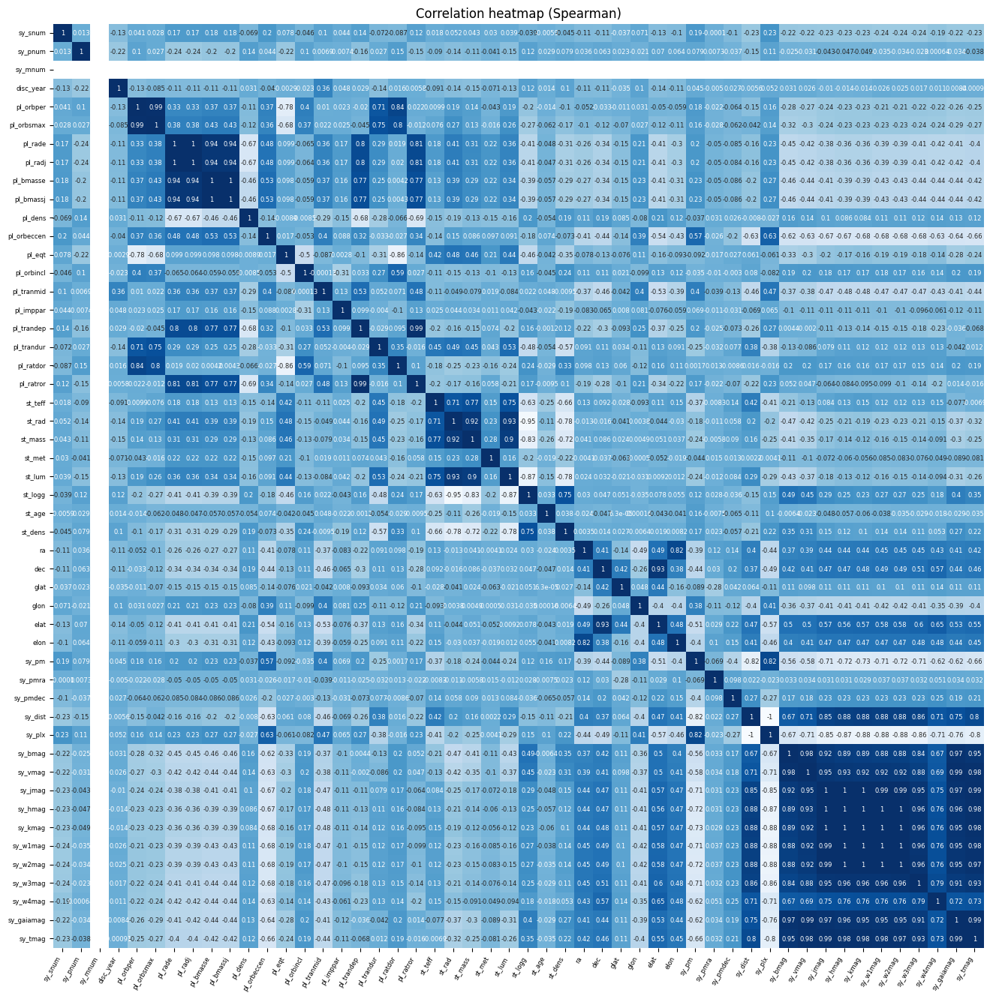

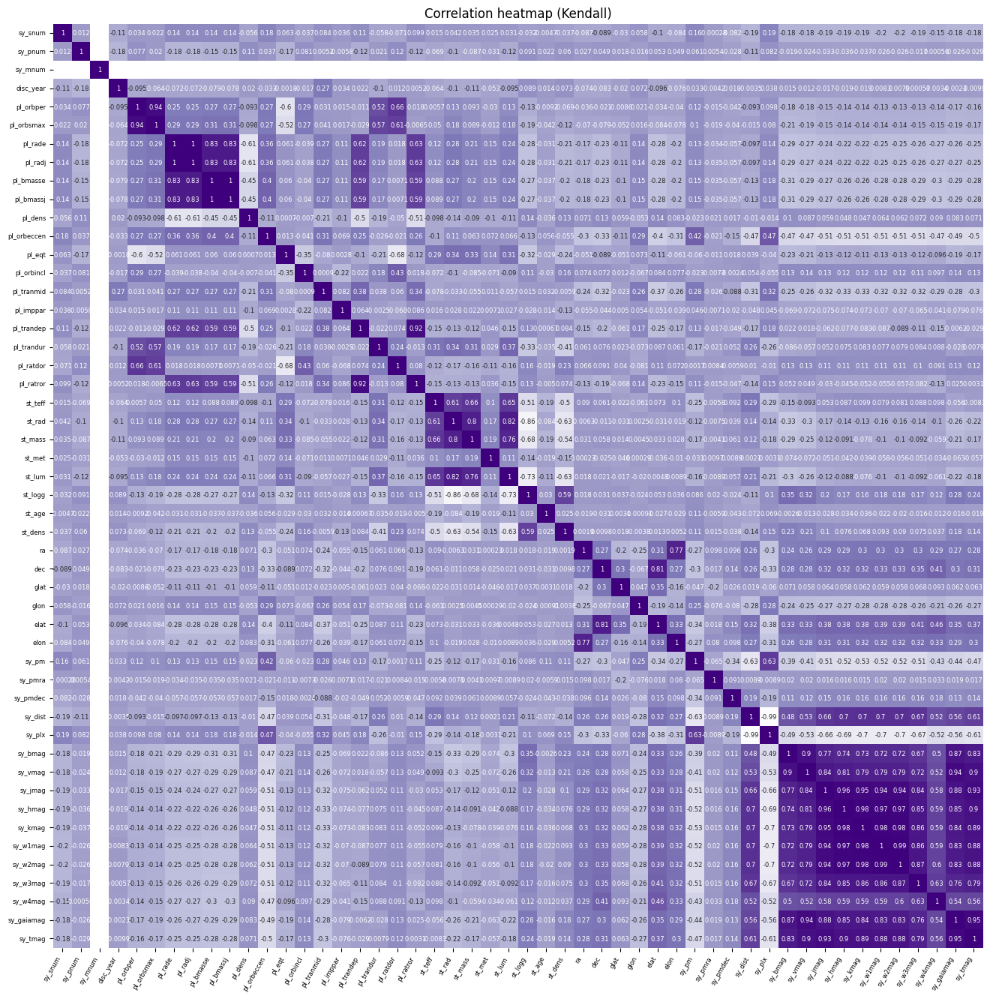

In [5]:
col = df.select_dtypes(include='number')
col_names = list(col.columns)

# Correlation analysis using Spearman
cor_sp = col.corr('spearman')
fig, ax1 = plt.subplots(figsize=(16, 16))
sns.heatmap(cor_sp, cmap='Blues', annot=True, ax=ax1, annot_kws={'fontsize':6}, cbar=False)
ax1.set_xticklabels(col_names, rotation=60, ha='right', fontsize=6)
ax1.set_yticklabels(col_names, rotation=0, ha='right', fontsize=6)
ax1.set_title('Correlation heatmap (Spearman)')

# Correlation analysis using Kendall
cor_ken = col.corr('kendall')
fig, ax2 = plt.subplots(figsize=(16, 16))
sns.heatmap(cor_ken, cmap='Purples', annot=True, ax=ax2, annot_kws={'fontsize':6}, cbar=False)
ax2.set_xticklabels(col_names, rotation=60, ha='right', fontsize=6)
ax2.set_yticklabels(col_names, rotation=0, ha='right', fontsize=6)
ax2.set_title('Correlation heatmap (Kendall)')

plt.show()

In [6]:
print(f"Unused columns for correlation analysis: \n {set(df.columns) - set(col.columns)}")
print("\n")
print(f"Total number of columns used for correlation analysis: {len(col_names)}")
print("\n")
print("Spearman Analysis")
print("------------------")
print(f"100% correlation: \n {[(col1, col2) for col1 in cor_sp.columns for col2 in cor_sp.columns if col1 < col2 and round(cor_sp.loc[col1, col2]*100,0) == 100]}")
print("\n")
print(f"90% correlation: \n {[(col1, col2) for col1 in cor_sp.columns for col2 in cor_sp.columns if col1 < col2 and round(cor_sp.loc[col1, col2]*100,0) >= 90]}")
print("\n\n")
print("Kendall Analysis")
print("------------------")
print(f"100% correlation: \n {[(col1, col2) for col1 in cor_ken.columns for col2 in cor_ken.columns if col1 < col2 and round(cor_ken.loc[col1, col2]*100,0) == 100]}")
print("\n")
print(f"90% correlation: \n {[(col1, col2) for col1 in cor_ken.columns for col2 in cor_ken.columns if col1 < col2 and round(cor_ken.loc[col1, col2]*100,0) >= 90]}")

Unused columns for correlation analysis: 
 {'disc_telescope', 'tran_flag', 'cb_flag', 'disc_locale', 'micro_flag', 'ast_flag', 'ima_flag', 'dkin_flag', 'ttv_flag', 'ptv_flag', 'pul_flag', 'st_spectype', 'st_metratio', 'etv_flag', 'disc_instrument', 'pl_bmassprov', 'hostname', 'pl_name', 'discoverymethod', 'rv_flag', 'disc_facility', 'obm_flag'}


Total number of columns used for correlation analysis: 50


Spearman Analysis
------------------
100% correlation: 
 [('pl_rade', 'pl_radj'), ('pl_bmasse', 'pl_bmassj'), ('sy_jmag', 'sy_kmag'), ('sy_hmag', 'sy_jmag'), ('sy_hmag', 'sy_kmag'), ('sy_hmag', 'sy_w1mag'), ('sy_hmag', 'sy_w2mag'), ('sy_kmag', 'sy_w1mag'), ('sy_kmag', 'sy_w2mag'), ('sy_w1mag', 'sy_w2mag')]


90% correlation: 
 [('pl_orbper', 'pl_orbsmax'), ('pl_rade', 'pl_radj'), ('pl_bmasse', 'pl_rade'), ('pl_bmasse', 'pl_radj'), ('pl_bmasse', 'pl_bmassj'), ('pl_bmassj', 'pl_rade'), ('pl_bmassj', 'pl_radj'), ('pl_ratror', 'pl_trandep'), ('st_mass', 'st_rad'), ('st_lum', 'st_rad'), ('

#### Deciding which columns to drop between the highly correlated columns

The dataset offers two units of measurement for estimating planetary mass: Earth mass and Jupiter mass. Jupiter is roughly 318 times more massive than Earth. Radius measurements can also be given in Jupiter units, with Jupiter having a value of 11.2 Earth radii. Since most exoplanets are much larger than Earth and closer in size to Jupiter, using Jupiter units makes it easier to compare and categorize exoplanets based on their size and characteristics. Therefore, we can drop both *pl_rade* and *pl_bmasse*. 

Furthermore, the heatmap shows that there is a high correlation among photometry measurements, which are electromagnetic radiation measurements emitted by the host star at different wavelengths. As I am not yet knowledgeable enough to determine which of these measurements is the best representation of the data I will keep them for the preliminary data cleanup.

#### Correlation between more than two variables
While correlation functions are useful for identifying relationships between pairs of features, they have limitations when it comes to analyzing the relationships among more than two features. For example, I suspect that there must be some correlation between the planetary density *pl_dens* and the *pl_radj* and *pl_bmassj* becasue we can calculate the density of a sphere using mass and radius: $Density = {Mass \over Volume}$ and volume of a sphere can be calculated: $Volume = {4 \over 3} \cdot \pi \cdot r^3$. But assuming that all planets are perfectly spherical might lead to oversimplified and inaccurate models. Unfortunately, calculating correlations for three or more features at a time is not straightforward, so for now, it may be better to include all features.

In [7]:
df = df.drop(['pl_rade', 'pl_bmasse'], axis=1)

## Discovery methods <a name="discovery-methods" />

As of the data export date, there are currently **5347** confirmed exoplanets from 4010 different planetary systems!

<div align="center" style="padding: 10px 0 30px 0;">
    <fig>
        <img alt="Kepler Space Telescope spacecraft" src="./img/kepler-spacecraft-model.png" width="300">
        <figcaption align="center">Largest batch of discoveries happened through Kepler space telescope in 2016</figcaption>
    </fig>
</div>


The dataset provides us with the following types of discovery method:

#### Transit
- Searching for shadows
- When planet passes directly between its star and an observer, it dims the star's light by a measureable amount
- 3982 planets discovered (74.8%)

#### Radial Velocity
- Watching for wobble
- Orbiting planets cause stars to wobble in space caused by the gravitational tug, changing the color of the light astronomers observe
- 1032 planets discovered (19.4%)

#### Gravitational Microlensing
- Light in a gravity lens
- Light from distant star is bent and focused by gravity as a planet passes between the star and Earth
- 181 planets discovered (3.4%)

#### Direct Imaging
- Directly observing through a telescope
- Astronomers can take pictures of exoplanets by removing the overwhelming glare of the stars they orbit
- 64 planets discovered (1.2%)

#### Transit Timing Variations
- Detecting exoplanets by observing variations in the timing of a transit
- 25 planets discovered (0.47%)

#### Eclipse Timing Variations
- A planet orbiting an eclipsing binary star system can disrupt the regular rhythm of the binary eclipses
- 17 planets discovered (0.32%)

#### Orbital Brightness Modulation
- 9 planets discovered (0.17%)

#### Pulsar Timing
- 7 planets discovered (0.13%)

#### Astrometry
- Minuscule movements
- The orbit of a planet can cause a star to wobble around in space in relation to nearby stars in the sky
- 2 planets discovered (0.04%)

#### Pulsation Timing Variations
- 2 planets discovered (0.04%)

#### Disk Kinematics
- 1 planet discovered (0.02%)

In [8]:
discovery_methods = df.groupby('discoverymethod').agg(count=('discoverymethod', 'count')).sort_values(by='count', ascending=False)
discovery_methods.reset_index()
discovery_methods['percentage'] = round(100 * discovery_methods['count'] / discovery_methods['count'].sum(), 2)
discovery_methods

,count,percentage
discoverymethod,,
Transit,3988,74.58
Radial Velocity,1036,19.38
Microlensing,193,3.61
Imaging,67,1.25
Transit Timing Variations,25,0.47
Eclipse Timing Variations,17,0.32
Orbital Brightness Modulation,9,0.17
Pulsar Timing,7,0.13
Astrometry,2,0.04


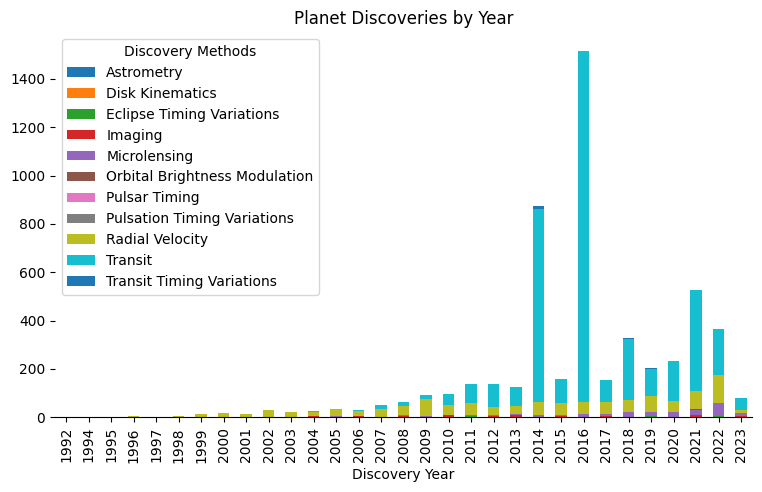

In [9]:
df.groupby(['disc_year','discoverymethod']).size().unstack().plot.bar(stacked=True,figsize=(9,5))
plt.xlabel('Discovery Year')
plt.legend(title='Discovery Methods')
plt.title('Planet Discoveries by Year')
sns.despine(left=True)
sns.set_theme(style="ticks")
plt.show()

### Relationship between planet features and discovery method <a name="relationship-between-planet-features-and-discovery-method" />

There is a strong correlation between the method used to discover a planet and its associated characteristics. For instance, the radial velocity method requires a massive planet to be located in close proximity to the host star, inducing a significant gravitational pull that causes a measurable wobble in the star's motion. This method is particularly effective in detecting gas giants, which have a higher mass and thus a stronger gravitational effect on the star.

Additionally, the transit method relies on detecting the temporary decrease in the brightness of the star when a planet passes in front of it, or transits. To produce a detectable transit signal, the planet must be aligned such that its orbit passes directly in front of the star, as viewed from Earth. This requires a relatively small impact parameter, which measures the orientation of the planet's orbit relative to our line of sight. Furthermore, for the transit method, planets that are closer to their host stars are more likely to be detected. This is because the geometric probability of the planetary orbit being in near the line-of-sight increases as expressed in this equation $Probability_{LOS} = {d_* \over 2a}$  where $d_*$ is the stellar diameter and $a$ is the semi-major axis <a href="#footnote-2">[2]</a>



Direct imaging, involves directly observing the light emitted by the planet itself. This method is only effective in observing giant planets that are both bright and sufficiently distanced from the host star to be resolved from the star's glare.

The wide range of planetary and stellar parameters involved in exoplanet detection, such as mass, radius, temperature, and luminosity, spans multiple orders of magnitude. To visualize these differences, I created the box plots on a logarithmic scale (with exception to eccentricity, *pl_orbeccen*). I also created a scatter plots on pairs of data that I thought might be interesting to look at when grouped up by discovery methods. Some of the plots created a very interesting line of planets discovered by radial velocity. The trend seems to be showing up when plotting radius, mass or density. 

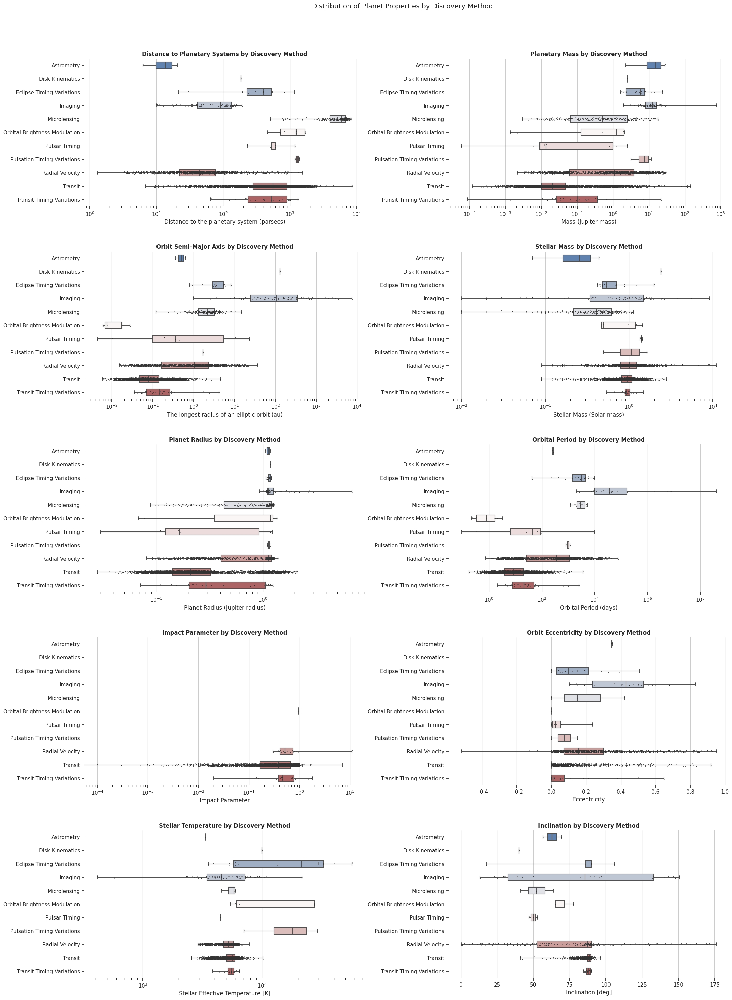

In [10]:
sns.set_theme(style='ticks')
discovery_methods = sorted(df['discoverymethod'].unique())

fig, ax = plt.subplots(5, 2, figsize=(20, 28))
fig.tight_layout(h_pad=6, w_pad=12)
axes = ax.flatten()


def graph_boxplot(ax, x, xlabel, title, scale='log'):
    sns.boxplot(x=x, y='discoverymethod', data=df, whis=[0, 100], width=0.5, palette='vlag', ax=ax, order=discovery_methods)
    sns.stripplot(x=x, y='discoverymethod', data=df, size=2, color='0.2', linewidth=0, ax=ax, order=discovery_methods)
    ax.set_xscale(scale)
    ax.xaxis.grid(True)
    ax.set_ylabel('')
    ax.set_xlabel(xlabel)
    ax.set_title(title, fontweight='bold')
    sns.despine(trim=True, left=True, ax=ax)

graph_boxplot(axes[0], 'sy_dist', 'Distance to the planetary system (parsecs)', 'Distance to Planetary Systems by Discovery Method')
graph_boxplot(axes[1], 'pl_bmassj', 'Mass (Jupiter mass)', 'Planetary Mass by Discovery Method')
graph_boxplot(axes[2], 'pl_orbsmax','The longest radius of an elliptic orbit (au)', 'Orbit Semi-Major Axis by Discovery Method')  
graph_boxplot(axes[3], 'st_mass', 'Stellar Mass (Solar mass)', 'Stellar Mass by Discovery Method')
graph_boxplot(axes[4], 'pl_radj', 'Planet Radius (Jupiter radius)', 'Planet Radius by Discovery Method')
graph_boxplot(axes[5], 'pl_orbper', 'Orbital Period (days)', 'Orbital Period by Discovery Method')
graph_boxplot(axes[6], 'pl_imppar', 'Impact Parameter', 'Impact Parameter by Discovery Method')
graph_boxplot(axes[7], 'pl_orbeccen', 'Eccentricity', 'Orbit Eccentricity by Discovery Method', scale='linear')
graph_boxplot(axes[8], 'st_teff', 'Stellar Effective Temperature [K]', 'Stellar Temperature by Discovery Method')
graph_boxplot(axes[9], 'pl_orbincl', 'Inclination [deg]', 'Inclination by Discovery Method', scale='linear')
fig.suptitle('Distribution of Planet Properties by Discovery Method', y=1.05)
plt.show()

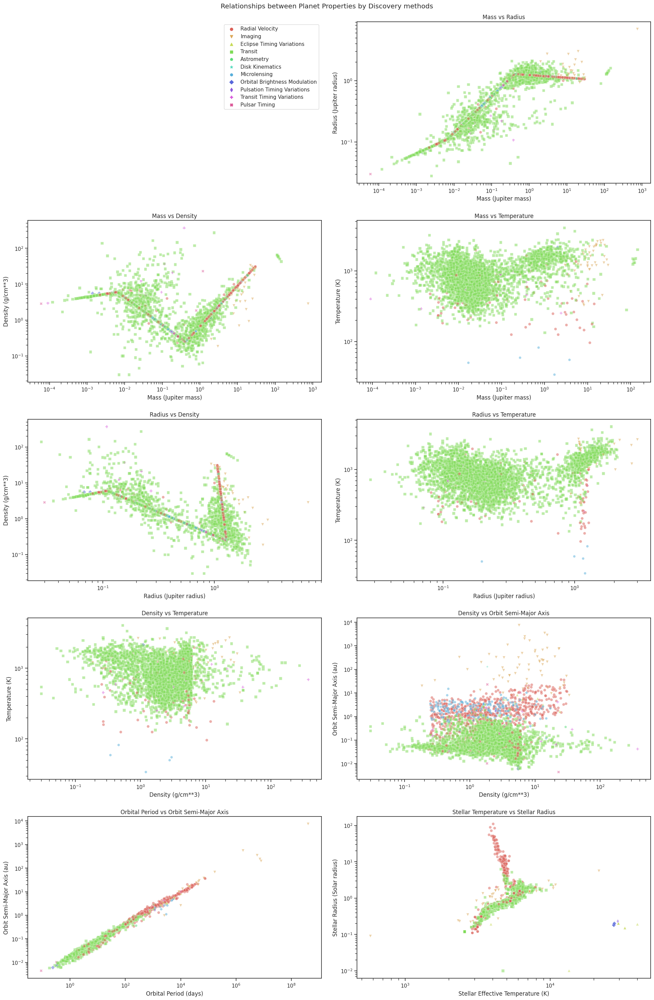

In [11]:
fig, ax = plt.subplots(5,2, figsize=(20, 30))
axes = ax.flatten()

discovery_methods = df['discoverymethod'].unique()
palette = sns.color_palette('hls', len(discovery_methods))
markers = ['o', 'v', '^', 's', 'p', '*', 'h', 'D', 'd', 'P', 'X'] # plt.Line2D.filled_markers
palette_dict = {}
marker_dict = {}


for i in range(len(discovery_methods)):
    palette_dict[discovery_methods[i]] = palette[i]
    marker_dict[discovery_methods[i]] = markers[i]
    
def graph_scatterplot(x, y, ax, title, xlabel, ylabel, xscale='log', yscale='log'):
    data = df.loc[(df[x].notnull()) & (df[y].notnull())][[x, y, 'discoverymethod']]
    sns.scatterplot(x=x, y=y, data=data, ax=ax, hue='discoverymethod', style='discoverymethod', palette=palette_dict, markers=marker_dict, alpha=0.5)
    ax.legend().set_title('')
    ax.set_title(title)
    ax.set_xscale(xscale)
    ax.set_yscale(yscale)
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.legend().remove()

graph_scatterplot('pl_bmassj', 'pl_radj', axes[1], 'Mass vs Radius', 'Mass (Jupiter mass)', 'Radius (Jupiter radius)')
graph_scatterplot('pl_bmassj', 'pl_dens', axes[2], 'Mass vs Density', 'Mass (Jupiter mass)', 'Density (g/cm**3)')
graph_scatterplot('pl_bmassj', 'pl_eqt', axes[3], 'Mass vs Temperature', 'Mass (Jupiter mass)', 'Temperature (K)')
graph_scatterplot('pl_radj', 'pl_dens', axes[4], 'Radius vs Density', 'Radius (Jupiter radius)', 'Density (g/cm**3)')
graph_scatterplot('pl_radj', 'pl_eqt', axes[5], 'Radius vs Temperature', 'Radius (Jupiter radius)', 'Temperature (K)')
graph_scatterplot('pl_dens', 'pl_eqt', axes[6], 'Density vs Temperature', 'Density (g/cm**3)', 'Temperature (K)')
graph_scatterplot('pl_dens', 'pl_orbsmax', axes[7], 'Density vs Orbit Semi-Major Axis', 'Density (g/cm**3)', 'Orbit Semi-Major Axis (au)') 
graph_scatterplot('pl_orbper', 'pl_orbsmax', axes[8], 'Orbital Period vs Orbit Semi-Major Axis', 'Orbital Period (days)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot('st_teff', 'st_rad', axes[9], 'Stellar Temperature vs Stellar Radius', 'Stellar Effective Temperature (K)', 'Stellar Radius (Solar radius)')

# Place the legend in the first subplot
axes[0].axis('off')
axes[0].legend(*axes[1].get_legend_handles_labels()) # Unpack the tuple returned by get_legend_handles_labels()

fig.tight_layout(pad=2)
fig.suptitle('Relationships between Planet Properties by Discovery methods', y=1)
plt.show()

## Stellar host <a name="stellar-host" />

Grouping the planets by their host star name returns 3989 distinct planetary system, some of which have as many as 8 planets in orbit.

In [12]:
stars = df.groupby('hostname').agg(num_planets=('hostname', 'count'))
print(f"Total number of distinct stars: {stars.shape[0]}")
planet_count = stars.groupby('num_planets').agg(count=('num_planets', 'count')).sort_values(by='num_planets')
planet_count

Total number of distinct stars: 4010


,count
num_planets,
1,3128
2,586
3,189
4,70
5,25
6,10
7,1
8,1


### Binary and multiple star systems <a name="binary-and-multiple-star-system" />

In some cases, a small number of stars orbit each other, bound by gravitational attraction. In the NASA exoplanet dataset, some exoplanets have been found in these binary or multiple star systems. Some exoplanets orbit around one of the double or multiple stars, while a smaller number of exoplanets orbit around two stars instead of one, which is known as a circumbinary planet.

In [13]:
# Planets in binary or multiple star system
df.loc[df['sy_snum'] > 1][['hostname','pl_name','sy_snum','sy_pnum','cb_flag']].sort_values(by=['sy_snum','sy_pnum','hostname','pl_name'], ascending=[False,False,True,True]).describe()

,sy_snum,sy_pnum
count,485.000000,485.000000
mean,2.119588,1.870103
std,0.337296,1.279864
min,2.000000,1.000000
25%,2.000000,1.000000
50%,2.000000,1.000000
75%,2.000000,2.000000
max,4.000000,6.000000


In [14]:
# Circumbinary planet
df.loc[(df['sy_snum'] > 1) & (df['cb_flag'] == 1)][['hostname','pl_name','sy_snum','sy_pnum','cb_flag']].sort_values(by=['hostname','pl_name']).describe()

,sy_snum,sy_pnum
count,45.000000,45.000000
mean,2.044444,1.488889
std,0.298142,0.726831
min,2.000000,1.000000
25%,2.000000,1.000000
50%,2.000000,1.000000
75%,2.000000,2.000000
max,4.000000,3.000000


## Web scraping exoplanet types <a name="web-scraping-exoplanet-types" />

Scientists have categorized the discoverd planets into the 4 following categories: Neptunian, Gas giant, Super-earth, Terrestrial.

Although the NASA Exoplanet Archive doesn't include the exoplanet type data for each planet, I was able to obtain this information from the [NASA's exoplanet catalog](https://exoplanets.nasa.gov/discovery/exoplanet-catalog/) site. To do this, I wrote a [web_scraper.py](/web_scraping/web_scraper.py) script that scraped the data and saved it to [nasa_exoplanet_catalog.csv](/web_scraping/nasa_exoplanet_catalog.csv). By merging the two datasets using the identifying columns, I can add the exoplanet type information to the original data. Turns out the column *ranger_feature_id* from the new dataset and *pl_name* from the original can be matched with a small modification.

The data was acquired on 2023-04-06.

#### Neptunian
- similar in size to Neptune or Uranus that typically have hydrogen and helium-dominated atmospheres with cores of rock and heavier metals.
- 1835 planets discovered

#### Gas giant
- a giant planet composed mainly of gas (helium and or hydrogen)
- 1679 planets discovered
- "hot Jupiters", gas giants nearer to their stars make such tight orbits that they cause a pronounced wobble in their stars, making it easier to detect using the radial velocity method.

#### Super-Earth
- more massive than Earth yet lighter than ice giants like Neptune and Uranus, and can be made of gas, rock or a combination of both
- 1608 planets discovered

#### Terrestrial
- Earth sized and smaller composed of rock, silicate, water or carbon
- 195 planets discovered

#### Unknown
- 5 planets discovered

In [15]:
df_ws = pd.read_csv('./data/web_scraping/nasa_exoplanet_catalog.csv')
df_ws.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5347 entries, 0 to 5346
Data columns (total 29 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5347 non-null   int64  
 1   pl_hostname        5347 non-null   object 
 2   pl_letter          5347 non-null   object 
 3   display_name       5347 non-null   object 
 4   description        5347 non-null   object 
 5   discovery_date     5347 non-null   int64  
 6   url                5347 non-null   object 
 7   title              5347 non-null   object 
 8   feature_title      5347 non-null   object 
 9   mass_display       5347 non-null   object 
 10  planet_type        5347 non-null   object 
 11  st_dist            5328 non-null   float64
 12  st_optmag          5146 non-null   float64
 13  pl_radj            5329 non-null   float64
 14  pl_rade            5330 non-null   float64
 15  pl_massj           5323 non-null   float64
 16  pl_discmethod      5347 

In [16]:
df['pl_name_lower'] = df['pl_name'].str.lower().str.replace(' ', '_') # Make the name lower case and replace space character with underscores
df_ws['ranger_feature_id'] = df_ws['ranger_feature_id'].str.lower() 
merged = pd.merge(df, df_ws[['ranger_feature_id', 'planet_type']], how='left', left_on = 'pl_name_lower', right_on = 'ranger_feature_id')
df = merged.drop(['pl_name_lower', 'ranger_feature_id'], axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5347 entries, 0 to 5346
Data columns (total 71 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   pl_name          5347 non-null   object 
 1   hostname         5347 non-null   object 
 2   sy_snum          5347 non-null   int64  
 3   sy_pnum          5347 non-null   int64  
 4   sy_mnum          5347 non-null   int64  
 5   cb_flag          5347 non-null   bool   
 6   discoverymethod  5347 non-null   object 
 7   disc_year        5347 non-null   int64  
 8   disc_locale      5347 non-null   object 
 9   disc_facility    5347 non-null   object 
 10  disc_telescope   5347 non-null   object 
 11  disc_instrument  5347 non-null   object 
 12  rv_flag          5347 non-null   bool   
 13  pul_flag         5347 non-null   bool   
 14  ptv_flag         5347 non-null   bool   
 15  tran_flag        5347 non-null   bool   
 16  ast_flag         5347 non-null   bool   
 17  obm_flag      

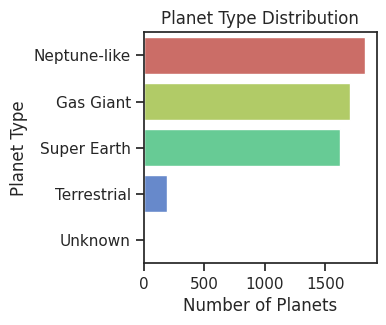

In [17]:
fig, ax = plt.subplots(figsize=(3, 3))
planet_types = df['planet_type'].value_counts()
sns.barplot(x=planet_types.values, y=planet_types.index, palette='hls')
plt.title('Planet Type Distribution')
plt.xlabel('Number of Planets')
plt.ylabel('Planet Type')
plt.show()

## Exoplanet physical characteristics <a name="exoplanet-physical-characteristics" />

In some cases, scientists may not have the exact mass of a planet but they may have other data that can be used to calculate the *minimum mass* of the planet. If they can also determine the orbital inclination *i*, the true mass can be obtained from the calculated minimum mass using the following relationship:

$$ M_{true} = {M_{min} \over sin(i)} $$

The column *pl_bmassj* provides the best planet mass estimate available, in order of preference: $M_{true}$, $M_{min} \cdot sin(i) \over sin(i)$, or $M_{min} \cdot sin(i)$, depending on availability. The column *pl_bmassprov* specifies the provenance of the measurement. If no mass estimates are available for a given planet, it will be excluded from the analysis. Additionally, we will remove outliers that fall outside of the interquartile range.

Same method can be applied to the column *pl_radj*, *pl_dens* and *pl_eq*.

In [18]:
print(f"df['pl_bmassj']   min: {df['pl_bmassj'].min():<10} max: {df['pl_bmassj'].max():<10} mean: {df['pl_bmassj'].mean():<10}")
print(f"df['pl_radj']     min: {df['pl_radj'].min():<10} max: {df['pl_radj'].max():<10} mean: {df['pl_radj'].mean():<10}")
print(f"df['pl_dens']     min: {df['pl_dens'].min():<10} max: {df['pl_dens'].max():<10} mean: {df['pl_dens'].mean():<10}")
print(f"df['pl_eqt']      min: {df['pl_eqt'].min():<10} max: {df['pl_eqt'].max():<10} mean: {df['pl_eqt'].mean():<10}")

df['pl_bmassj']   min: 6e-05      max: 752.0      mean: 1.4497204489949278
df['pl_radj']     min: 0.028      max: 6.9        mean: 0.5093959467066992
df['pl_dens']     min: 0.03       max: 372.0      mean: 3.921427012402213
df['pl_eqt']      min: 34.0       max: 4050.0     mean: 916.8739837398374


## Orbital parameters <a name="orbital-parameters" />

<div align="center">
    <img alt="semimajor axis" src="./img/semi-major-axis.png" width="250">
    <img alt="orbital plane" src="./img/orbital-plane.png" width="350">
</div>


#### Size and shape of the orbit
+ Semi-major axis
    - determines the size of the ellipse 
    - ${d_{periapsis} + d_{apoapsis}} \over 2$ or simply, half length of the major axis in the ellipse
    - *pl_orbsmax*
+ Eccentricity
    - determines the shape of the ellipse
    - how elongated compared to circle
    - *pl_orbeccen*
    
#### Orientation of the orbit
+ Inclination
    - vertical tilt of the ellipse with respect to the reference plane, measured at the ascending node (where the orbit passes upward through the reference plane, the green angle i in the diagram)
    - *pl_orbincl*
+ Argument of periasitron
    - defines the orientation of the ellipse in the orbital plane, as an angle measured from the ascending node to the periapsis (the closest point the satellite object comes to the primary object around which it orbits, the blue angle ω in the diagram)
    - *pl_orblper* <a href="#footnote-3">[3]</a>

#### Other
+ Orbital period
    - time the planet takes to maek a complete orbit around the host star or system
    - *pl_orbper*
+ Impact parameter
    - The sky-projected distance between the center of the stellar disc and the center of the planet disc at conjunction, normalized by the stellar radius
    - *pl_imppar*
+ Transit depth
    - The size of the relative flux decrement caused by the orbiting body transiting in front of the star [%]
    - *pl_trandep*
+ Transit duration 
    - The length of time from the moment the planet begins to cross the stellar limb to the moment the planet finishes crossing the stellar limb [hrs]
    - *pl_trandur*
+ Ratio of semi-major axis to stellar radius
    - The distance between the planet and the star at mid-transit divided by the stellar radius. For the case of zero orbital eccentricity, the distance at mid-transit is the semi-major axis of the planetary orbit
    - *pl_ratdor*
+ Ratio of planet to stellar radius
    - The planet radius divided by the stellar radius
    - *pl_ratror*


    

#### Unknown parameters
Most exoplanets have been discovered using indirect methods and therefore only some of their orbital parameters can be determined. For example, planets discovered by radial-velocity method cannot determine the inclination nor the longitude of the ascending node.


#### Other notes
Planets discovered by transit method is more likely to have data on transit duration, transit depth, impact parameter, ratio of semi-major axis to stellar radius, and transit midpoint. Consider this fact when planning for regression later. 

In [19]:
print(f"Number of planets with unknown value of semi-major axis: {df['pl_orbsmax'].isnull().sum()} \n"
      f"Number of planets with unknown value of eccentricity: {df['pl_orbeccen'].isnull().sum()} \n"
      f"Number of planets with unknown value of inclination: {df['pl_orbincl'].isnull().sum()} \n"
      f"Number of planets with unknown value of orbital period: {df['pl_orbper'].isnull().sum()}")
# pl_orblper has been dropped from feature list due to missing data for many planets

Number of planets with unknown value of semi-major axis: 283 
Number of planets with unknown value of eccentricity: 725 
Number of planets with unknown value of inclination: 1301 
Number of planets with unknown value of orbital period: 231


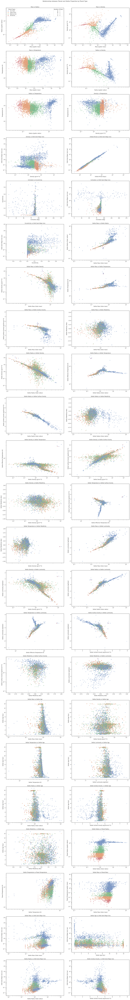

In [20]:
fig, ax = plt.subplots(23,2, figsize=(20, 150))
axes = ax.flatten()

def graph_scatterplot(x, y, ax, title, xlabel, ylabel, show_legend=False, x_scale='log', y_scale='log'):
    data = df.loc[(df[x].notnull()) & (df[y].notnull())][[x, y, 'planet_type', 'sy_snum']]
    sns.scatterplot(x=x, y=y, data=data, ax=ax, hue='planet_type', style='sy_snum', alpha=0.5)
    ax.set_yscale(y_scale)
    ax.set_xscale(x_scale)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        labels[0] = 'Planet Type'
        labels[len(labels)//2] = 'Number of Stars'
        legend1 = ax.legend(handles=handles[1:len(handles)//2], labels=labels[1:len(labels)//2], loc='upper left', title='Planet Types')
        ax.add_artist(legend1)
        legend2 = ax.legend(handles=handles[len(handles)//2+1:],labels=labels[len(labels)//2+1:], loc='upper right', title='Number of Stars')
    else:
        ax.legend().remove()

graph_scatterplot('pl_bmassj', 'pl_radj', axes[0], 'Mass vs Radius', 'Mass (Jupiter mass)', 'Radius (Jupiter radius)', show_legend=True)
graph_scatterplot('pl_bmassj', 'pl_dens', axes[1], 'Mass vs Density', 'Mass (Jupiter mass)', 'Density (g/cm**3)')
graph_scatterplot('pl_bmassj', 'pl_eqt', axes[2], 'Mass vs Temperature', 'Mass (Jupiter mass)', 'Temperature (K)')
graph_scatterplot('pl_radj', 'pl_dens', axes[3], 'Radius vs Density', 'Radius (Jupiter radius)', 'Density (g/cm**3)')
graph_scatterplot('pl_radj', 'pl_eqt', axes[4], 'Radius vs Temperature', 'Radius (Jupiter radius)', 'Temperature (K)')
graph_scatterplot('pl_dens', 'pl_eqt', axes[5], 'Density vs Temperature', 'Density (g/cm**3)', 'Temperature (K)')
graph_scatterplot('pl_dens', 'pl_orbsmax', axes[6], 'Density vs Orbit Semi-Major Axis', 'Density (g/cm**3)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot('pl_orbper', 'pl_orbsmax', axes[7], 'Orbital Period vs Orbit Semi-Major Axis', 'Orbital Period (days)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot('pl_orbincl', 'pl_orbeccen', axes[8], 'Inclination vs Eccentricity', 'Inclination (deg)', 'Eccentricity', x_scale='linear', y_scale='linear')
graph_scatterplot('pl_orbincl', 'pl_orbsmax', axes[9], 'Inclination vs Orbit Semi-Major Axis', 'Inclination (deg)', 'Orbit Semi-Major Axis (au)', x_scale='linear')
graph_scatterplot('pl_orbeccen', 'pl_orbsmax', axes[10], 'Eccentricity vs Orbit Semi-Major Axis', 'Eccentricity', 'Orbit Semi-Major Axis (au)', x_scale='linear')

graph_scatterplot('st_mass', 'st_rad', axes[11], 'Stellar Mass vs Stellar Radius', 'Stellar Mass (Solar mass)', 'Stellar Radius (Solar radius)')
graph_scatterplot('st_mass', 'st_dens', axes[12], 'Stellar Mass vs Stellar Density', 'Stellar Mass (Solar mass)', 'Stellar Density (g/cm**3)')
graph_scatterplot('st_mass', 'st_teff', axes[13], 'Stellar Mass vs Stellar Temperature', 'Stellar Mass (Solar mass)', 'Stellar Temperature (K)')
graph_scatterplot('st_mass', 'st_logg', axes[14], 'Stellar Mass vs Stellar Surface Gravity', 'Stellar Mass (Solar mass)', 'Stellar Surface Gravity log10(cm/s**2)', y_scale='linear')
graph_scatterplot('st_mass', 'st_met', axes[15], 'Stellar Mass vs Stellar Metallicity', 'Stellar Mass (Solar mass)', 'Stellar Metallicity (dex)', y_scale='linear')
graph_scatterplot('st_rad', 'st_dens', axes[16], 'Stellar Radius vs Stellar Density', 'Stellar Radius (Solar radius)', 'Stellar Density (g/cm**3)')
graph_scatterplot('st_rad', 'st_teff', axes[17], 'Stellar Radius vs Stellar Temperature', 'Stellar Radius (Solar radius)', 'Stellar Effective Temperature (K)')
graph_scatterplot('st_rad', 'st_logg', axes[18], 'Stellar Radius vs Stellar Surface Gravity', 'Stellar Radius (Solar radius)', 'Stellar Surface Gravity log10(cm/s**2)', y_scale='linear')
graph_scatterplot('st_rad', 'st_met', axes[19], 'Stellar Radius vs Stellar Metallicity', 'Stellar Radius (Solar radius)', 'Stellar Metallicity (dex)', y_scale='linear')
graph_scatterplot('st_dens', 'st_teff', axes[20], 'Stellar Density vs Stellar Temperature', 'Stellar Density (g/cm**3)', 'Stellar Effective Temperature (K)')
graph_scatterplot('st_dens', 'st_logg', axes[21], 'Stellar Density vs Stellar Surface Gravity', 'Stellar Density (g/cm**3)', 'Stellar Surface Gravity log10(cm/s**2)', y_scale='linear')
graph_scatterplot('st_dens', 'st_met', axes[22], 'Stellar Density vs Stellar Metallicity', 'Stellar Density (g/cm**3)', 'Stellar Metallicity (dex)', y_scale='linear')
graph_scatterplot('st_teff', 'st_logg', axes[23], 'Stellar Temperature vs Stellar Surface Gravity', 'Stellar Effective Temperature (K)', 'Stellar Surface Gravity log10(cm/s**2)', y_scale='linear')
graph_scatterplot('st_teff', 'st_met', axes[24], 'Stellar Temperature vs Stellar Metallicity', 'Stellar Density (g/cm**3)', 'Stellar Metallicity (dex)', y_scale='linear')
graph_scatterplot('st_mass', 'st_lum', axes[25], 'Stellar Mass vs Stellar Luminosity', 'Stellar Mass (Solar mass)', 'Stellar Luminosity log(Solar)', y_scale='linear')
graph_scatterplot('st_dens', 'st_lum', axes[26], 'Stellar Density vs Stellar Luminosity', 'Stellar Density (g/cm**3)', 'Stellar Luminosity log(Solar)', y_scale='linear')
graph_scatterplot('st_rad', 'st_lum', axes[27], 'Stellar Radius vs Stellar Luminosity', 'Stellar Radius (Solar radius)', 'Stellar Luminosity log(Solar)', y_scale='linear')
graph_scatterplot('st_teff', 'st_lum', axes[28], 'Stellar Temperature vs Stellar Luminosity', 'Stellar Effective Temperature (K)', 'Stellar Luminosity log(Solar)', y_scale='linear')
graph_scatterplot('st_logg', 'st_lum', axes[29], 'Stellar Surface Gravity vs Stellar Luminosity', 'Stellar Surface Gravity log10(cm/s**2)', 'Stellar Luminosity log(Solar)', x_scale='linear', y_scale='linear')
graph_scatterplot('st_met', 'st_lum', axes[30], 'Stellar Metallicity vs Stellar Surface Gravity', 'Stellar Metallicity (dex)', 'Stellar Surface Gravity log10(cm/s**2)', x_scale='linear')
graph_scatterplot('st_met', 'st_logg', axes[31], 'Stellar Metallicity vs Stellar Luminosity', 'Stellar Metallicity (dex)', 'Stellar Luminosity log(Solar)', x_scale='linear', y_scale='linear')
graph_scatterplot('st_mass', 'st_age', axes[32], 'Stellar Mass vs Stellar Age', 'Stellar Mass (Solar mass)', 'Stellar Age (Gyr)', y_scale='linear')
graph_scatterplot('st_dens', 'st_age', axes[33], 'Stellar Density vs Stellar Age', 'Stellar Density (g/cm**3)', 'Stellar Age (Gyr)', y_scale='linear')
graph_scatterplot('st_teff', 'st_age', axes[34], 'Stellar Temperature vs Stellar Age', 'Stellar Temperature (K)', 'Stellar Age (Gyr)', y_scale='linear')
graph_scatterplot('st_lum', 'st_age', axes[35], 'Stellar Luminosity vs Stellar Age', 'Stellar Luminosity log(Solar)', 'Stellar Age (Gyr)', x_scale='linear', y_scale='linear')
graph_scatterplot('st_rad', 'st_age', axes[36], 'Stellar Radius vs Stellar Age', 'Stellar Radius (Solar radius)', 'Stellar Age (Gyr)', y_scale='linear')
graph_scatterplot('st_logg', 'st_age', axes[37], 'Stellar Surface Gravity  vs Stellar Age', 'Stellar Surface Gravity log10(cm/s**2)', 'Stellar Age (Gyr)', x_scale='linear', y_scale='linear')
graph_scatterplot('st_met', 'st_age', axes[38], 'Stellar Metallicity  vs Stellar Age', 'Stellar Metallicity (dex)', 'Stellar Age (Gyr)', x_scale='linear', y_scale='linear')

graph_scatterplot('st_rad', 'pl_radj', axes[39], 'Stellar Radius vs Planet Radius', 'Stellar Radius (Solar radius)', 'Planet Radius (Jupiter radius)')
graph_scatterplot('st_teff', 'pl_eqt', axes[40], 'Stellar Temperature vs Planet Temperature', 'Stellar Temperature (K)', 'Planet Temperature (K)')
graph_scatterplot('st_mass', 'pl_bmassj', axes[41], 'Stellar Mass vs Planet Mass', 'Stellar Mass (Solar mass)', 'Planet Temperature (Jupiter mass)')
graph_scatterplot('st_mass', 'pl_orbsmax', axes[42], 'Stellar Mass vs Orbit Semi-Major Axis', 'Stellar Mass (Solar mass)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot('st_age', 'pl_orbsmax', axes[43], 'Stellar Age vs Orbit Semi-Major Axis', 'Stellar Age (Gyr)', 'Orbit Semi-Major Axis (au)', x_scale='linear')
graph_scatterplot('st_rad', 'pl_orbsmax', axes[44], 'Stellar Radius vs Orbit Semi-Major Axis', 'Stellar Radius (Solar radius)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot('st_logg', 'pl_orbsmax', axes[45], 'Stellar Surface Gravity  vs Orbit Semi-Major Axis', 'Stellar Surface Gravity log10(cm/s**2)', 'Orbit Semi-Major Axis (au)', x_scale='linear')



fig.suptitle('Relationships between Planet and Stellar Properties by Planet Type', y=1)
fig.tight_layout(pad=2)
plt.show()

## Detecting outliers <a name="detecting-outliers" />

Deciding whether to remove outliers from a dataset can be a challenging task, and ultimately depends on the objective of the analysis. Outliers can arise due to various factors, including measurement errors or genuine observations that deviate significantly from the majority of the data. If the outliers are due to measurement errors, it might be appropriate to remove them from the dataset, as they can significantly impact the results of the analysis. However, if the outliers are genuine observations, removing them might result in loss of important information.

Boxplots offer a quick visualization for detecting outliers, as they enable you to identify data points that are distant from the majority of the data. Additionally, examining the data's density distribution can be useful. If the data is skewed instead of being normally distributed, the likelihood of outliers occurring is higher.             

In [21]:
print(f"Number of planets with unknown value of mass: {df['pl_bmassj'].isnull().sum()} \n"
      f"Number of planets with unknown value of radius: {df['pl_radj'].isnull().sum()} \n"
      f"Number of planets with unknown value of density: {df['pl_dens'].isnull().sum()} \n"
      f"Number of planets with unknown value of temperature: {df['pl_eqt'].isnull().sum()}")

Number of planets with unknown value of mass: 24 
Number of planets with unknown value of radius: 18 
Number of planets with unknown value of density: 106 
Number of planets with unknown value of temperature: 1411


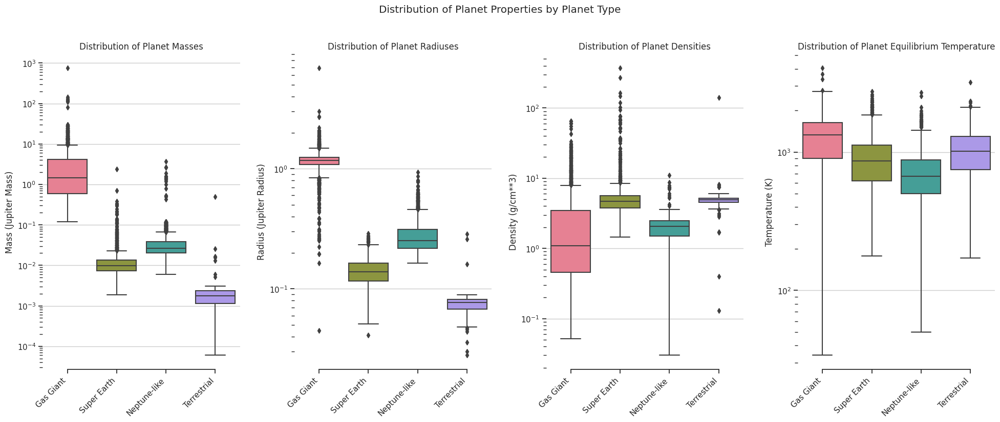

In [22]:
fig, ax = plt.subplots(1, 4, figsize=(20, 8))
axes = ax.flatten()

def graph_boxplot(ax, y, ylabel, title):
    data = df.loc[df[y].notnull()][[y,'planet_type']]
    sns.boxplot(x='planet_type', y=y, data=data, palette='husl', ax=ax, showfliers=True)
    ax.yaxis.grid(True)
    ax.set_xlabel('')
    ax.set_ylabel(ylabel)
    ax.set_yscale('log')
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    sns.despine(trim=True, left=True, ax=ax)

graph_boxplot(axes[0], 'pl_bmassj','Mass (Jupiter Mass)', 'Distribution of Planet Masses')
graph_boxplot(axes[1], 'pl_radj','Radius (Jupiter Radius)', 'Distribution of Planet Radiuses')
graph_boxplot(axes[2], 'pl_dens','Density (g/cm**3)', 'Distribution of Planet Densities')
graph_boxplot(axes[3], 'pl_eqt','Temperature (K)', 'Distribution of Planet Equilibrium Temperature')

fig.tight_layout(pad=2)
fig.suptitle('Distribution of Planet Properties by Planet Type', y=1.05)
plt.show()

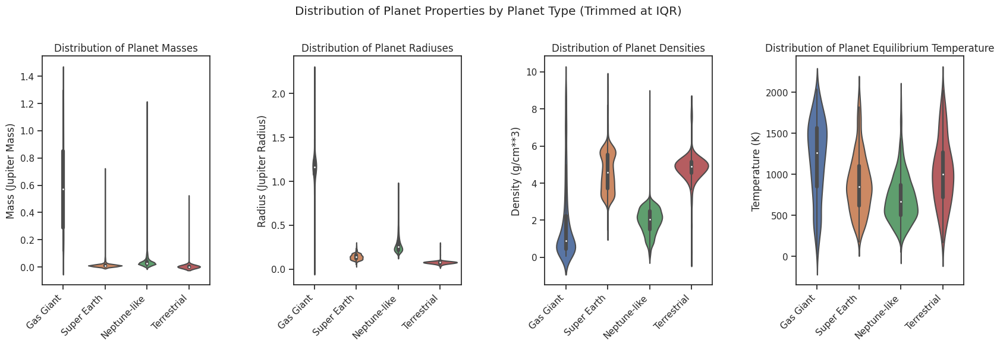

In [23]:
'''
Returns interquartile range
'''
def iqr(data):
    q1 = data.describe()['25%']
    q3 = data.describe()['75%']
    IQR = q3 - q1
    return (q1-1.5*IQR, q3+1.5*IQR)

fig, ax = plt.subplots(1, 4, figsize=(20, 5))
axes = ax.flatten()

def graph_violinplot(ax, y, title, ylabel):
    data = df.loc[(df[y].notnull() & df[y] > iqr(df[y])[0]) & (df[y] < iqr(df[y])[1])][[y, 'planet_type', 'pl_name']]
    sns.violinplot(y=y, x='planet_type', data=data, ax=ax)
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_xlabel('')
    

graph_violinplot(axes[0], 'pl_bmassj', 'Distribution of Planet Masses', 'Mass (Jupiter Mass)')
graph_violinplot(axes[1], 'pl_radj', 'Distribution of Planet Radiuses', 'Radius (Jupiter Radius)')
graph_violinplot(axes[2], 'pl_dens', 'Distribution of Planet Densities', 'Density (g/cm**3)')
graph_violinplot(axes[3], 'pl_eqt', 'Distribution of Planet Equilibrium Temperature', 'Temperature (K)')

fig.subplots_adjust(wspace=0.5)
fig.suptitle('Distribution of Planet Properties by Planet Type (Trimmed at IQR)', y=1.05)
plt.show()

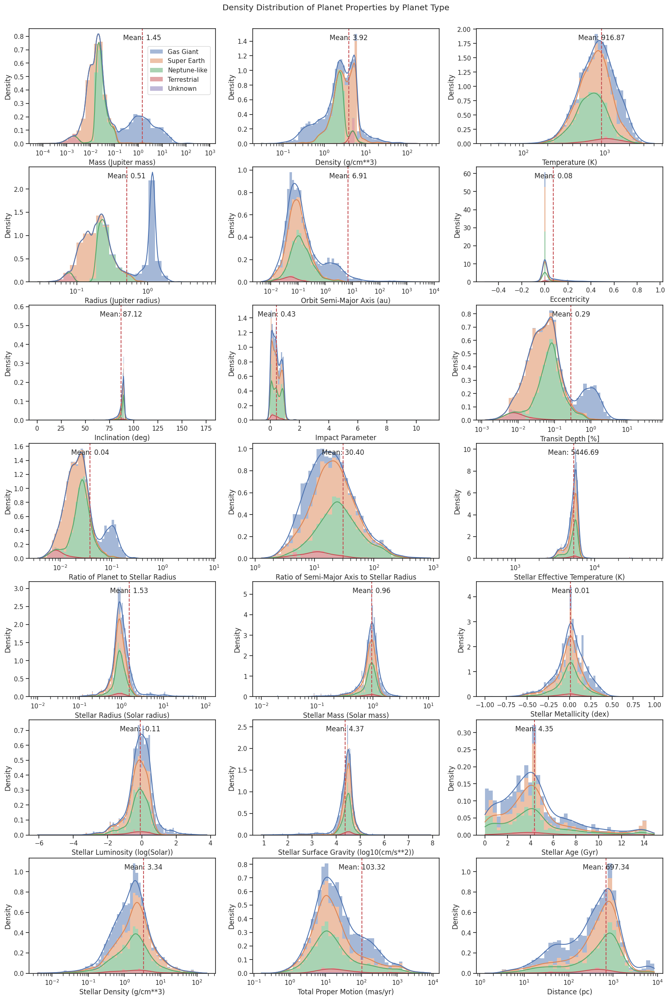

In [24]:
fig, ax = plt.subplots(7,3, figsize=(20, 30))
axes = ax.flatten()

def graph_histplot(x, ax, xlabel, log_scale=True, show_legend=False):
    sns.histplot(df[[x,'planet_type']], ax=ax, kde=True, stat='density', linewidth=0, log_scale=log_scale, hue='planet_type', x=x, multiple='stack', legend=show_legend)
    mean = np.mean(df[x])
    ax.axvline(x=mean, color='r', linestyle='--', label='Mean')
    ax.set_xlabel(xlabel)
    ax.text(mean, ax.get_ylim()[1]*0.9, f'Mean: {mean:0.2f}', ha='center')
    if show_legend:
        legend = ax.get_legend()
        legend.set_title('')
        legend.set_bbox_to_anchor((0.62, 0.4))

        
graph_histplot('pl_bmassj', axes[0], 'Mass (Jupiter mass)', show_legend=True)
graph_histplot('pl_dens', axes[1], 'Density (g/cm**3)')
graph_histplot('pl_eqt', axes[2], 'Temperature (K)')
graph_histplot('pl_radj', axes[3], 'Radius (Jupiter radius)')
graph_histplot('pl_orbsmax', axes[4], 'Orbit Semi-Major Axis (au)')
graph_histplot('pl_orbeccen', axes[5], 'Eccentricity', log_scale=False)
graph_histplot('pl_orbincl', axes[6], 'Inclination (deg)', log_scale=False)
graph_histplot('pl_imppar', axes[7], 'Impact Parameter', log_scale=False)
graph_histplot('pl_trandep', axes[8], 'Transit Depth [%]')
graph_histplot('pl_ratror', axes[9], 'Ratio of Planet to Stellar Radius')
graph_histplot('pl_ratdor', axes[10], 'Ratio of Semi-Major Axis to Stellar Radius')
graph_histplot('st_teff', axes[11], 'Stellar Effective Temperature (K)')
graph_histplot('st_rad', axes[12], 'Stellar Radius (Solar radius)')
graph_histplot('st_mass', axes[13], 'Stellar Mass (Solar mass)')
graph_histplot('st_met', axes[14], 'Stellar Metallicity (dex)', log_scale=False)
graph_histplot('st_lum', axes[15], 'Stellar Luminosity (log(Solar))', log_scale=False)
graph_histplot('st_logg', axes[16], 'Stellar Surface Gravity (log10(cm/s**2))', log_scale=False)
graph_histplot('st_age', axes[17], 'Stellar Age (Gyr)', log_scale=False)
graph_histplot('st_dens', axes[18], 'Stellar Density (g/cm**3)')
graph_histplot('sy_pm', axes[19], 'Total Proper Motion (mas/yr)')
graph_histplot('sy_dist', axes[20], 'Distance (pc)')
    
fig.suptitle('Density Distribution of Planet Properties by Planet Type', y=0.90)
plt.show()

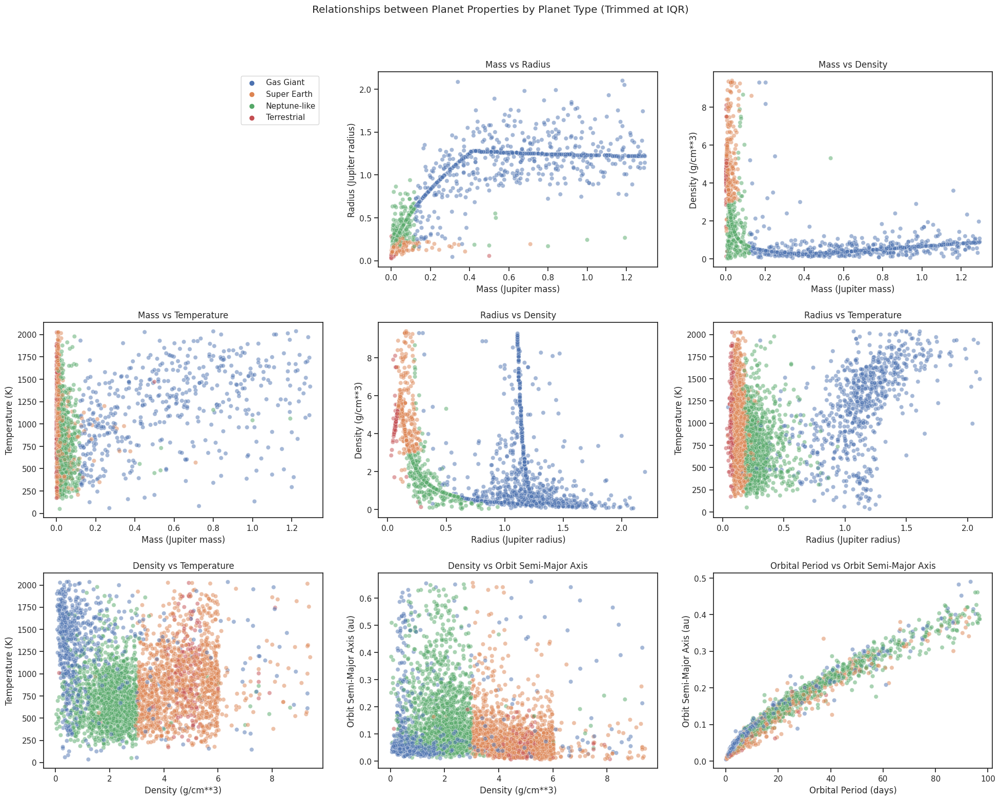

In [25]:
fig, ax = plt.subplots(3,3, figsize=(20, 15))
axes = ax.flatten()

def iqr_data(col):
    return df.loc[(df[col].notnull() & df[col] > iqr(df[col])[0]) & (df[col] < iqr(df[col])[1])][[col, 'planet_type', 'pl_name']]

def merge_df(df1, df2):
    return pd.merge(df1, df2, how='inner', on=['pl_name', 'planet_type'])

def graph_scatterplot2(x, y, ax, title, xlabel, ylabel):
    data = merge_df(iqr_data(x), iqr_data(y))
    sns.scatterplot(x=x, y=y, data=data, ax=ax, hue='planet_type', alpha=0.5)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend().remove()

graph_scatterplot2('pl_bmassj', 'pl_radj', axes[1], 'Mass vs Radius', 'Mass (Jupiter mass)', 'Radius (Jupiter radius)')
graph_scatterplot2('pl_bmassj', 'pl_dens', axes[2], 'Mass vs Density', 'Mass (Jupiter mass)', 'Density (g/cm**3)')
graph_scatterplot2('pl_bmassj', 'pl_eqt', axes[3], 'Mass vs Temperature', 'Mass (Jupiter mass)', 'Temperature (K)')
graph_scatterplot2('pl_radj', 'pl_dens', axes[4], 'Radius vs Density', 'Radius (Jupiter radius)', 'Density (g/cm**3)')
graph_scatterplot2('pl_radj', 'pl_eqt', axes[5], 'Radius vs Temperature', 'Radius (Jupiter radius)', 'Temperature (K)')
graph_scatterplot2('pl_dens', 'pl_eqt', axes[6], 'Density vs Temperature', 'Density (g/cm**3)', 'Temperature (K)')
graph_scatterplot2('pl_dens', 'pl_orbsmax', axes[7], 'Density vs Orbit Semi-Major Axis', 'Density (g/cm**3)', 'Orbit Semi-Major Axis (au)')
graph_scatterplot2('pl_orbper', 'pl_orbsmax', axes[8], 'Orbital Period vs Orbit Semi-Major Axis', 'Orbital Period (days)', 'Orbit Semi-Major Axis (au)')
axes[0].axis('off')
axes[0].legend(*axes[1].get_legend_handles_labels()) # Unpack the tuple returned by get_legend_handles_labels()

fig.tight_layout(pad=2)
fig.suptitle('Relationships between Planet Properties by Planet Type (Trimmed at IQR)', y=1.05)
plt.show()

## Footnotes

<p id="footnote-1">[1] The parameters in a given row may have been drawn from different sources and may have calculated values that are not necessarily self-consistent.</p>
<p id="footnote-2">[2] Borucki, W. J., “FRESIP: A Mission to Determine the Character and Frequency of Extra-Solar Planets Around Solar-Like Stars”, <i>Astrophysics and Space Science</i>, vol. 241, no. 1, pp. 111–134, 1996. doi:10.1007/BF00644220.
<p id="footnote-1">[3] Values in the dataset is not corrected to a standardized system, some publications refer the planet's orbit, others to the host star's reflex orbit, which differs by 180 deg.</p>